In [1]:
import numpy as np
import pandas as pd
import matplotlib as plt
import seaborn as sns
import re
import math
import string


In [2]:
 df= pd.read_csv("F:\\ExcelR\\P_38\\emails.csv")

In [3]:
df.shape

(48076, 5)

In [4]:
df.head(5)

,Unnamed: 0,filename,Message-ID,content,Class
0,0,arnold-j/_sent_mail/34.,<15267340.1075857594923.JavaMail.evans@thyme>,eat shit\n\n\n\n\nJohn J Lavorato@excelr\n11/1...,Abusive
1,1,arnold-j/_sent_mail/517.,<15539583.1075857652152.JavaMail.evans@thyme>,fuck you,Abusive
2,2,arnold-j/_sent_mail/743.,<4339799.1075857657711.JavaMail.evans@thyme>,Gentlemen:\nThe following champagne is availab...,Abusive
3,3,arnold-j/_sent_mail/766.,<25574783.1075857658215.JavaMail.evans@thyme>,sorry i've taken so long...just been trying to...,Abusive
4,4,arnold-j/_sent_mail/797.,<19506151.1075857658895.JavaMail.evans@thyme>,asshole\n\n\n\n\nJohn J Lavorato@excelr\n12/23...,Abusive


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48076 entries, 0 to 48075
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  48076 non-null  int64 
 1   filename    48076 non-null  object
 2   Message-ID  48076 non-null  object
 3   content     48076 non-null  object
 4   Class       48076 non-null  object
dtypes: int64(1), object(4)
memory usage: 1.8+ MB


In [6]:
df.describe()

,Unnamed: 0
count,48076.000000
mean,24037.500000
std,13878.490108
min,0.000000
25%,12018.750000
50%,24037.500000
75%,36056.250000
max,48075.000000


In [7]:
df.isnull().sum()

Unnamed: 0    0
filename      0
Message-ID    0
content       0
Class         0
dtype: int64

In [8]:
df.columns

Index(['Unnamed: 0', 'filename', 'Message-ID', 'content', 'Class'], dtype='object')

In [9]:
df['Class'].unique()

array(['Abusive', 'Non Abusive'], dtype=object)

In [10]:
df['Class'].value_counts()

Non Abusive    44666
Abusive         3410
Name: Class, dtype: int64

In [11]:
df['content'].unique()

array(['eat shit\n\n\n\n\nJohn J Lavorato@excelr\n11/18/2000 01:01 PM\nTo: John Arnold/HOU/ECT@ECT\ncc:  \nSubject: \n\nFootball bets 200 each\n\nMinn -9.5\nBuff +2.5\nPhil -7\nIndi -4.5\nCinnci +7\nDet +6\nclev +16\nDen +9.5\nDall +7.5\nJack +3.5\n\n\n',
       'fuck you',
       "Gentlemen:\nThe following champagne is available at 70% of approximate retail price. Also \nhave interest in trading for red wine.  Retail prices derived from Spec's \nwebsite or Winesearcer.com.  Wine has been stored at temperature controlled \nprivate wine storage facility.\n\n\nQuan      Vintage  Wine         Retail\n3  1990  Perrier Jouet Brut Fleur de Champagne  110 \n1  1988  Piper Heidsek Reserve    65 \n2  1990  Dom Perignon     125\n1  1990  Veuve Cliquot Ponsardin La Grande Dame 100\n1  1988  Taittenger Millesine Brut    85 \n1  1992  Jacquart Millesine    29\n3  1990  Roederer Cristal     200\n\nAny interest??",
       ...,
       '\n[IMAGE][IMAGE][IMAGE] \nDear SmartReminders member,\n[IMAGE]\t\n

In [12]:
# text cleaning to remove "\n\n" etc from content file
df['content']=df['content'].apply(lambda x: x.split('\n\n')[0])
df['content']=df['content'].apply(lambda x: x.split('\n')[0])
df['content']=df['content'].apply(lambda x: x.split('\t')[0])
df['content']=df['content'].apply(lambda x: x.split('\t[IMAGE]')[0])
df['content'].unique()

array(['eat shit', 'fuck you', 'Gentlemen:', ...,
       'Hello lcampbel@excelr.com:',
       'There will be a floor meeting today @ 2:30pm in room 3221a with Louise Kitchen and John Lavorato.',
       ' Do you need new leads for your business ?'], dtype=object)

In [13]:
df['filename'].unique()

array(['arnold-j/_sent_mail/34.', 'arnold-j/_sent_mail/517.',
       'arnold-j/_sent_mail/743.', ..., 'campbell-l/notes_inbox/135.',
       'campbell-l/notes_inbox/136.', 'campbell-l/notes_inbox/137.'],
      dtype=object)

In [14]:
# splitting the filename to identify major sender names
df['filename']=df['filename'].apply(lambda x: x.split('/')[0])
df['filename'].unique()

array(['arnold-j', 'arora-h', 'badeer-r', 'bailey-s', 'bass-e',
       'baughman-d', 'beck-s', 'benson-r', 'blair-l', 'brawner-s',
       'buy-r', 'campbell-l', 'carson-m', 'cash-m', 'causholli-m',
       'corman-s', 'crandell-s', 'cuilla-m', 'dasovich-j', 'davis-d',
       'dean-c', 'delainey-d', 'derrick-j', 'dickson-s', 'donoho-l',
       'donohoe-t', 'dorland-c', 'ermis-f', 'farmer-d', 'fischer-m',
       'forney-j', 'fossum-d', 'gang-l', 'gay-r', 'geaccone-t',
       'germany-c', 'gilbertsmith-d', 'giron-d', 'griffith-j',
       'grigsby-m', 'guzman-m', 'haedicke-m', 'hain-m', 'harris-s',
       'hayslett-r', 'heard-m', 'hendrickson-s', 'hernandez-j', 'hodge-j',
       'holst-k', 'horton-s', 'hyatt-k', 'hyvl-d', 'jones-t',
       'kaminski-v', 'kean-s', 'keavey-p', 'keiser-k', 'king-j',
       'kitchen-l', 'kuykendall-t', 'lavorato-j', 'lay-k', 'lenhart-m',
       'lewis-a', 'linder-e', 'lokay-m', 'lokey-t', 'love-p', 'lucci-p',
       'maggi-m', 'mann-k', 'martin-t', 'may-l', 'mc

In [63]:
df['filename'].value_counts()

beck-s        11830
bass-e         7823
campbell-l     5021
arnold-j       4898
blair-l        3415
              ...  
sanchez-m         1
grigsby-m         1
derrick-j         1
martin-t          1
corman-s          1
Name: filename, Length: 142, dtype: int64

In [15]:
df['Message-ID'].unique()

array(['<15267340.1075857594923.JavaMail.evans@thyme>',
       '<15539583.1075857652152.JavaMail.evans@thyme>',
       '<4339799.1075857657711.JavaMail.evans@thyme>', ...,
       '<31066400.1075857876537.JavaMail.evans@thyme>',
       '<26024436.1075857876659.JavaMail.evans@thyme>',
       '<10677824.1075857876692.JavaMail.evans@thyme>'], dtype=object)

In [16]:
#exploring few of the mails
for index,text in enumerate(df['content'][50:55]):
  print('Mail %d:\n'%(index+1),text)

Mail 1:
 I'm old now, but i can always find solace in the fact that you are older!  I 
Mail 2:
 she told me "you are not playing basketball on v day"
Mail 3:
 I can't make it this week, but I will bring in your jersey . . . bitch!
Mail 4:
 pussy
Mail 5:
 why not bitch?


In [17]:
# further text cleaning  
df['cleaned']=df['content'].apply(lambda x: x.lower()) # remove lower cases
df['cleaned']=df['cleaned'].apply(lambda x: re.sub('\w*\d\w*','', x)) # remove digits and words with digits
df['cleaned']=df['cleaned'].apply(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x)) # remove punctuation
df['cleaned']=df['cleaned'].apply(lambda x: re.sub(' +',' ',x)) # remove extra spaces

In [18]:
# check the cleaned mails
for index,text in enumerate(df['cleaned'][50:55]):
  print('Review %d:\n'%(index+1),text)  

Review 1:
 im old now but i can always find solace in the fact that you are older i 
Review 2:
 she told me you are not playing basketball on v day
Review 3:
 i cant make it this week but i will bring in your jersey bitch
Review 4:
 pussy
Review 5:
 why not bitch


In [19]:
# Preparing text data for EDA (stopword removal,Lemmatization, Create Term Document  Matrix)
import spacy

In [20]:
nlp = spacy.load('en_core_web_md',disable=['parser', 'ner'])

In [21]:
# Lemmatization with stopwords removal
df['lemmatized']=df['cleaned'].apply(lambda x: ' '.join([token.lemma_ for token in list(nlp(x)) if (token.is_stop==False)]))


In [22]:
df

,Unnamed: 0,filename,Message-ID,content,Class,cleaned,lemmatized
0,0,arnold-j,<15267340.1075857594923.JavaMail.evans@thyme>,eat shit,Abusive,eat shit,eat shit
1,1,arnold-j,<15539583.1075857652152.JavaMail.evans@thyme>,fuck you,Abusive,fuck you,fuck
2,2,arnold-j,<4339799.1075857657711.JavaMail.evans@thyme>,Gentlemen:,Abusive,gentlemen,gentleman
3,3,arnold-j,<25574783.1075857658215.JavaMail.evans@thyme>,sorry i've taken so long...just been trying to...,Abusive,sorry ive taken so longjust been trying to fen...,sorry have take longjust try fend chick life
4,4,arnold-j,<19506151.1075857658895.JavaMail.evans@thyme>,asshole,Abusive,asshole,asshole
...,...,...,...,...,...,...,...
48071,48071,campbell-l,<6503484.1075857876489.JavaMail.evans@thyme>,"Dear Market Participants,",Non Abusive,dear market participants,dear market participant
48072,48072,campbell-l,<17277180.1075857876513.JavaMail.evans@thyme>,"According to my fancy ciphering we made $310,0...",Non Abusive,according to my fancy ciphering we made for th...,accord fancy ciphering month
48073,48073,campbell-l,<31066400.1075857876537.JavaMail.evans@thyme>,BUSINESS HIGHLIGHTS,Non Abusive,business highlights,business highlight
48074,48074,campbell-l,<26024436.1075857876659.JavaMail.evans@thyme>,Welcome to: DIAMONDS NEWSLETTER Issue:...,Non Abusive,welcome to diamonds newsletter issue,welcome diamond newsletter issue


In [23]:
df_grouped=df[['filename','lemmatized']].groupby(by='filename').agg(lambda x:' '.join(x))
df_grouped.head()

,lemmatized
filename,
allen-p,forecast travel business meeting take fun trip...
arnold-j,eat shit fuck gentleman sorry have take longju...
arora-h,forward donald w herrickhouect forward don...
badeer-r,jeff jeff jeff office friday monday tuesday va...
bailey-s,steve thank probably aware department select...


In [24]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer(analyzer='word')
data=cv.fit_transform(df_grouped['lemmatized'])
df_dtm = pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm.index=df_grouped.index
df_dtm.head(3)

,aa,aahhhh,aaron,aaronnet,aarons,aas,ab,abandon,abb,abbnat,...,ziad,zimin,zin,zipped,zipper,zonal,zone,zoo,zoom,zulie
filename,,,,,,,,,,,,,,,,,,,,,
allen-p,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
arnold-j,0,0,0,0,0,0,0,0,0,0,...,0,0,5,0,1,0,0,0,5,0
arora-h,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,2,0,0,0


In [25]:
data

<142x10905 sparse matrix of type '<class 'numpy.int64'>'
	with 29800 stored elements in Compressed Sparse Row format>

In [26]:
# Importing wordcloud for plotting word clouds and textwrap for wrapping longer text
#pip install wordcloud
#conda install -c conda-forge wordcloud
#conda install -c anaconda pillow
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from wordcloud import WordCloud
from textwrap import wrap

In [60]:
from wordcloud import WordCloud,STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='black',
        stopwords=stopwords,
        max_words=50,
        max_font_size=30, 
        scale=3,
        random_state=1 
    ).generate(str(data))

    fig = plt.figure(1, figsize=(10, 10))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

In [69]:
# Transposing document term matrix
df_dtm=df_dtm.transpose()
df_dtm

filename,allen-p,arnold-j,arora-h,badeer-r,bailey-s,bass-e,baughman-d,beck-s,benson-r,blair-l,...,whalley-g,whalley-l,white-s,whitt-m,williams-j,williams-w3,wolfe-j,ybarbo-p,zipper-a,zufferli-j
aa,0,0,0,0,0,2,2,31,0,0,...,0,0,0,0,0,0,0,0,0,0
aahhhh,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aaron,0,0,0,0,0,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aaronnet,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aarons,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zonal,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zone,0,0,2,0,0,3,0,0,3,1,...,0,0,0,0,0,0,0,0,0,0
zoo,0,0,0,0,0,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
zoom,0,5,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


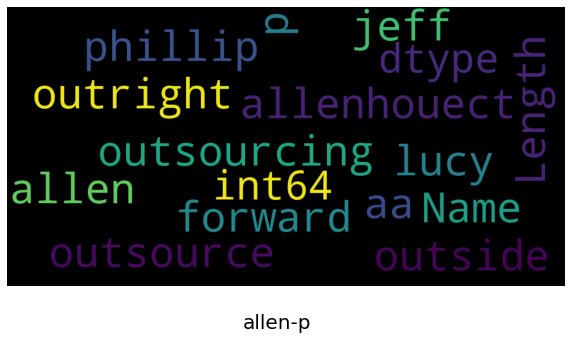

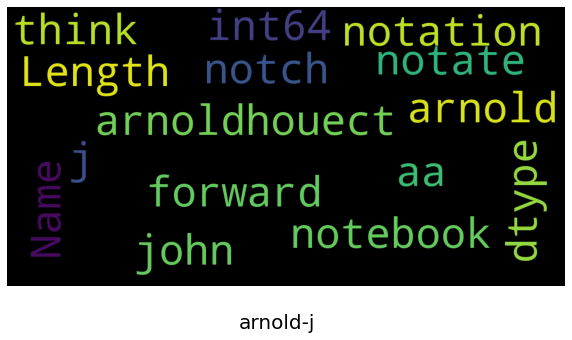

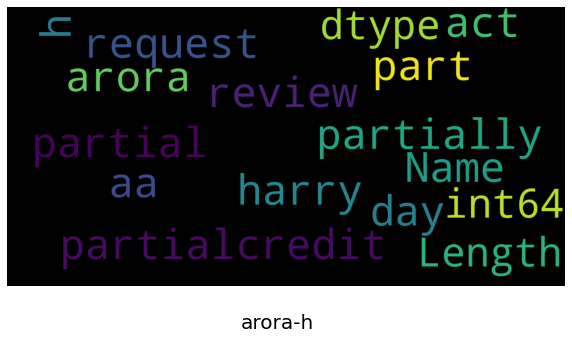

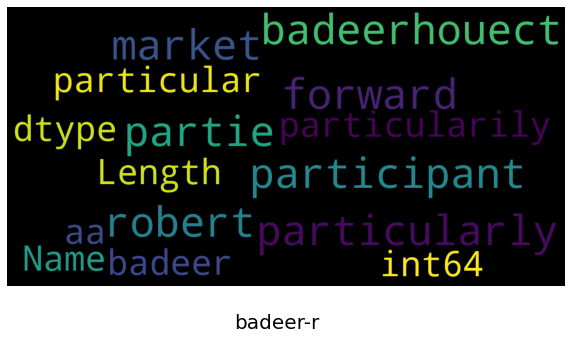

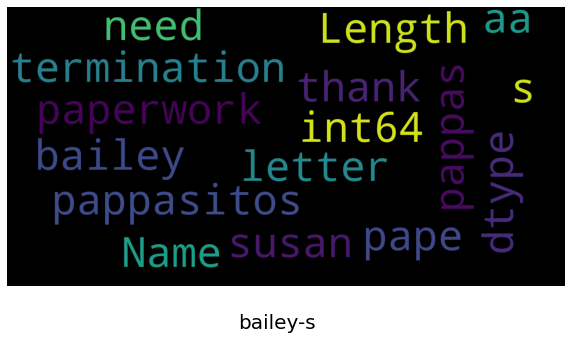

...

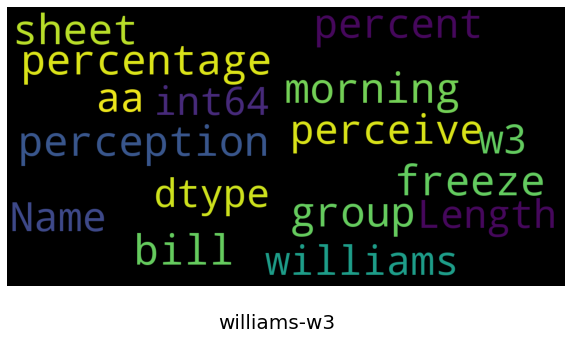

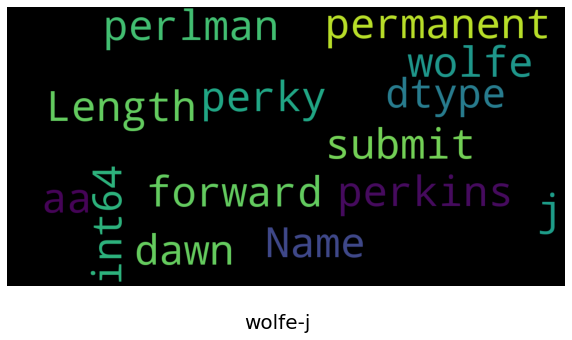

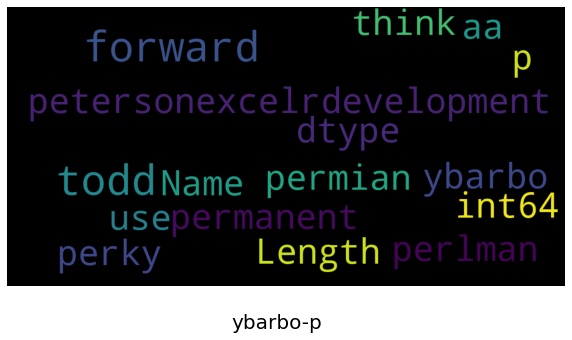

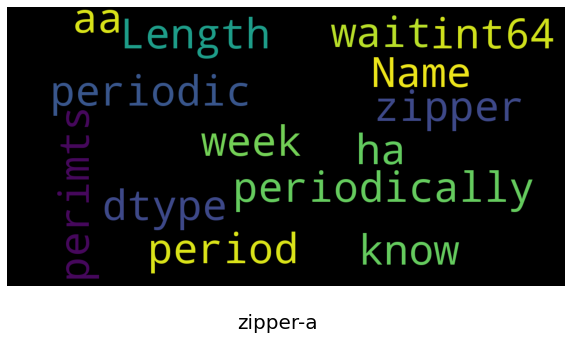

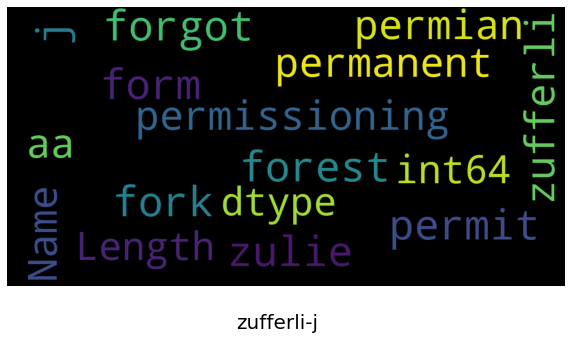

In [65]:
# Plotting word cloud for each filename
for index,filename in enumerate(df_dtm.columns):
    show_wordcloud(df_dtm[filename].sort_values(ascending=False),filename)

In [ ]:
#$ conda install -c conda-forge textblob
#$ python -m textblob.download_corpora
#$ pip install -U textblob
#$ python -m textblob.download_corpora

In [71]:
from textblob import TextBlob
df['polarity']=df['lemmatized'].apply(lambda x:TextBlob(x).sentiment.polarity)

In [74]:
print("5 Random Reviews with Highest Polarity:")
for index,review in enumerate(df.iloc[df['polarity'].sort_values(ascending=False)[:5].index]['content']):
  print('content{}:\n'.format(index+1),review)

5 Random Reviews with Highest Polarity:
content1:
 > PERFECT!!!!!!!!!
content2:
 I hope that your holiday was wonderful.  Nikki told me that you would be 
content3:
 > PERFECT!!!!!!!!!
content4:
 Technology is wonderful - I can log on here in the London office just as I do 
content5:
 excellent!!!!!


In [81]:
print("5 Random Reviews with Lowest Polarity:")
for index,review in enumerate(df.iloc[df['polarity'].sort_values(ascending=True)[:5].index]['content']):
  print('content{}:\n'.format(index+1),review)

5 Random Reviews with Lowest Polarity:
content1:
 awfully close......
content2:
 tomorrow is absolutely horrible for me.  let's talk in the am.  perhaps you 
content3:
 your receivers are terrible - i am trying to help you out!
content4:
 That is terrible news. Do you know who he was and what role he played? 
content5:
 just a vicious rumor... my birthday's not till next year.


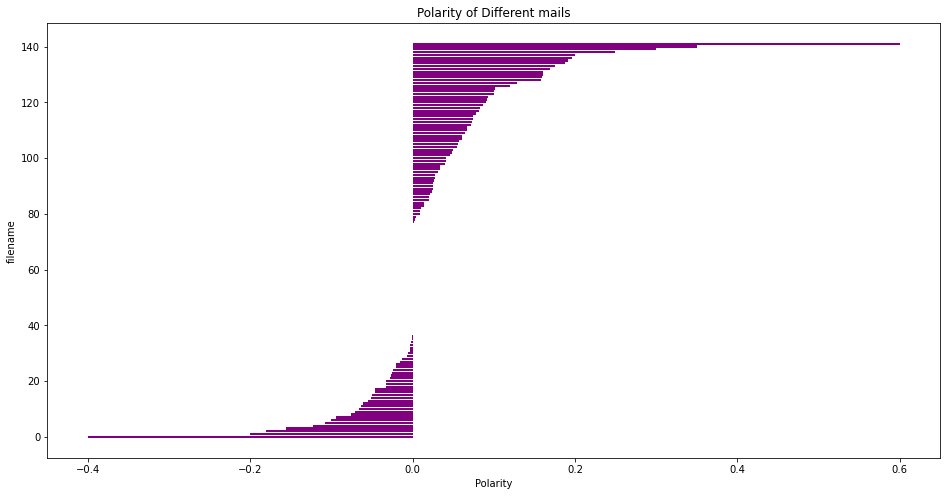

In [76]:
content_polarity_sorted=pd.DataFrame(df.groupby('filename')['polarity'].mean().sort_values(ascending=True))

plt.figure(figsize=(16,8))
plt.xlabel('Polarity')
plt.ylabel('filename')
plt.title('Polarity of Different mails')
polarity_graph=plt.barh(np.arange(len(content_polarity_sorted.index)),content_polarity_sorted['polarity'],color='purple',)


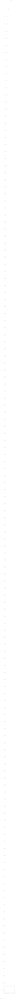

TypeError: unsupported operand type(s) for /: 'str' and 'int'

In [80]:
# Writing filenames on bar
for bar,filename in zip(polarity_graph,content_polarity_sorted.index):
  plt.text(0.005,bar.get_y()+bar.get_width(),'{}'.format(product),va='center',fontsize=11,color='black')

# Writing polarity values on graph
for bar,polarity in zip(polarity_graph,content_polarity_sorted['polarity']):
  plt.text(bar.get_width()+0.001,bar.get_y()+bar.get_width(),'%.3f'%polarity,va='center',fontsize=11,color='black')
  
plt.yticks([])
plt.show()


recommend_percentage=pd.DataFrame(((df.groupby('filename')['content'].sum()*100)/df.groupby('filename')['content'].count()).sort_values(ascending=True))

plt.figure(figsize=(16,8))
plt.xlabel('Recommend Percentage')
plt.ylabel('filename')
plt.title('Percentage of reviewers recommended a product')
recommend_graph=plt.barh(np.arange(len(recommend_percentage.index)),recommend_percentage['content'],color='green')
# Writing product names on bar
for bar,product in zip(recommend_graph,recommend_percentage.index):
  plt.text(0.5,bar.get_y()+0.4,'{}'.format(product),va='center',fontsize=11,color='red')

# Writing recommendation percentage on graph
for bar,percentage in zip(recommend_graph,recommend_percentage['content']): 
  plt.text(bar.get_width()+0.5,bar.get_y()+0.4,'%.2f'%percentage,va='center',fontsize=11,color='black')

plt.yticks([])
plt.show()


